In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100)

plt.style.use('dark_background')

#!pip install opencv-python
import cv2
import skimage
from skimage import color, exposure, filters

# Load and display image

(667, 1000, 3)


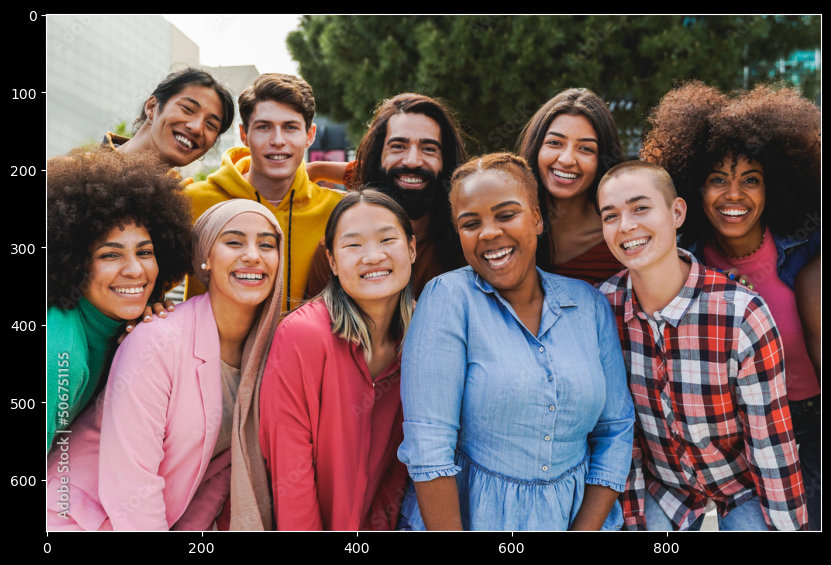

In [14]:
data_folder = 'C:/Users/Graham West/Python Notebooks/Meharry Teaching/Datasets/'

#image_path = 'Images/LakeLouise.jpg'
#image_path = 'Images/Logos.jpg'
#image_path = 'Images/Bolognese.png'
#image_path = 'Images/QuantumBookPage.jpg'
image_path = 'Images/DiversePeople.jpg'
#image_path = 'Images/P_01346_R_001.jpg'

image_path = data_folder + image_path

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
print(image.shape)

plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

# Resize the image

(500, 500, 3)


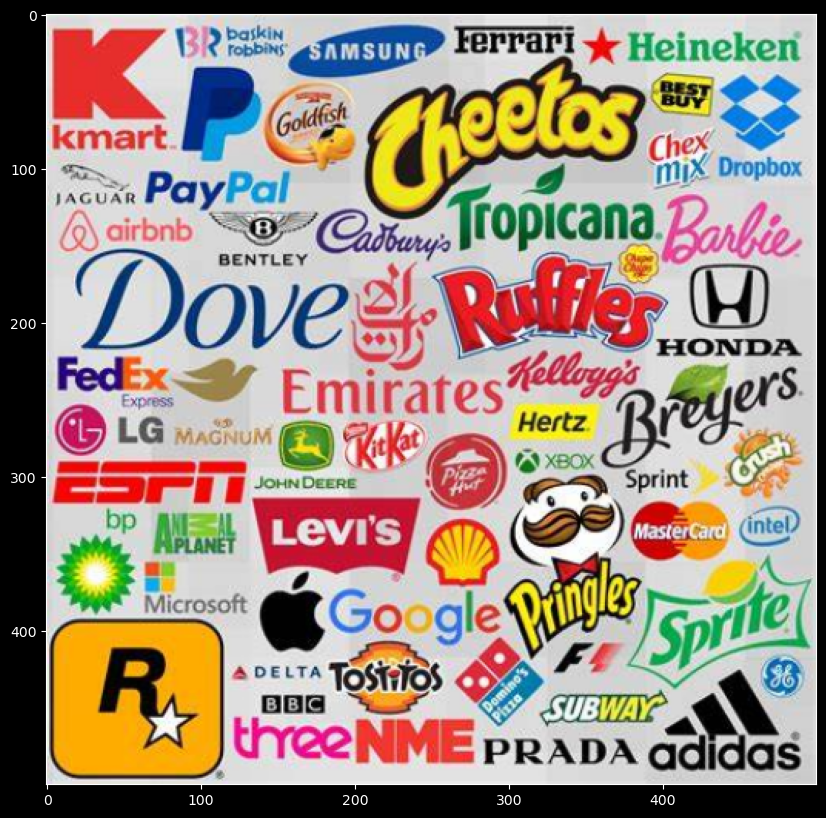

In [16]:
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize while preserving aspect ratio
target_width = 500
h, w = image.shape[:2]
aspect_ratio = h / w
target_height = int(target_width * aspect_ratio)

image = cv2.resize(image, (target_width, target_height))
print(image.shape)

plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

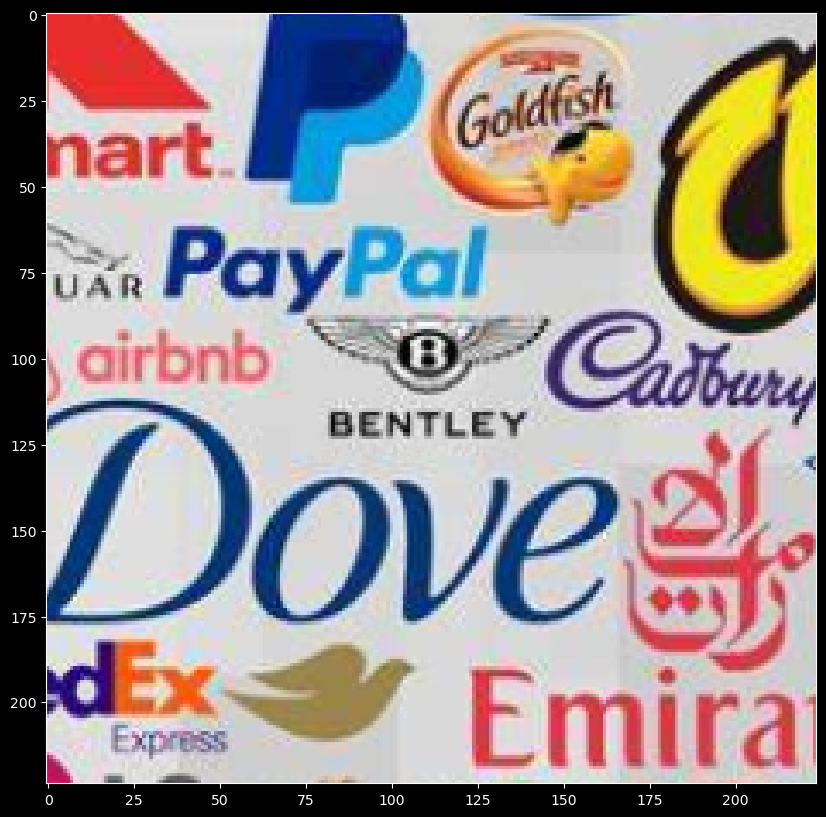

In [17]:
x = 40
y = 30
delta = 224

plt.figure(figsize=(10,10))
plt.imshow(image[x:x+delta,y:y+delta,:])
plt.show()

# Convert image to grayscale

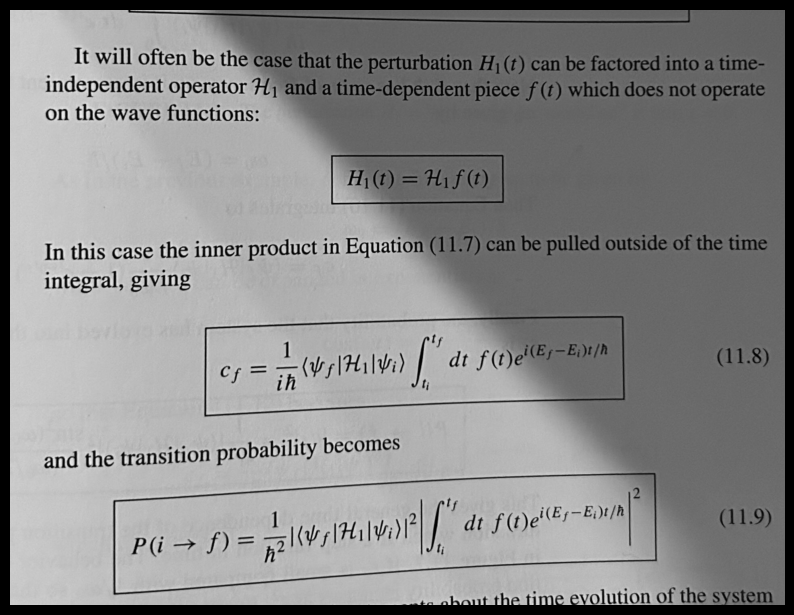

In [9]:
image_gray = color.rgb2gray(image)

if image_gray.dtype != np.uint8:
    image_gray = (image_gray * 255).astype(np.uint8)

plt.figure(figsize=(10,10))
plt.imshow(image_gray, cmap='gray')
plt.axis('off')
plt.show()

# Change contrast with gamma

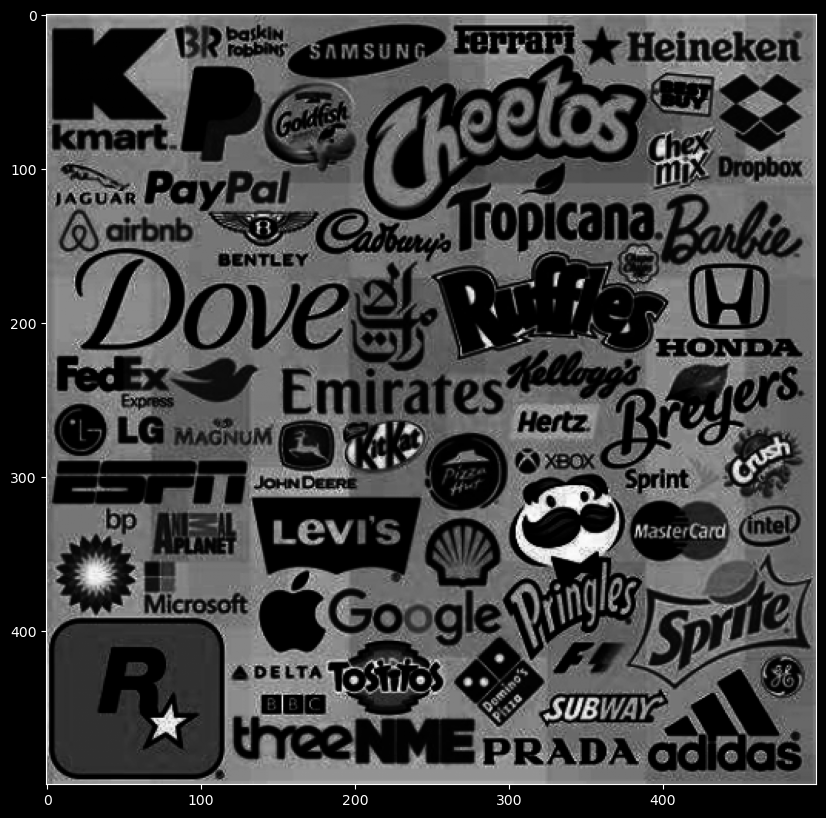

In [19]:
# normalize
#image_gray_gamme = image_gray / 255
image_gray_gamme = image_gray / image_gray.max()

gamma = 4.5

image_gray_gamme = image_gray_gamme ** gamma

plt.figure(figsize=(10,10))
plt.imshow(image_gray_gamme, cmap='gray')
plt.show()

# Image thresholding

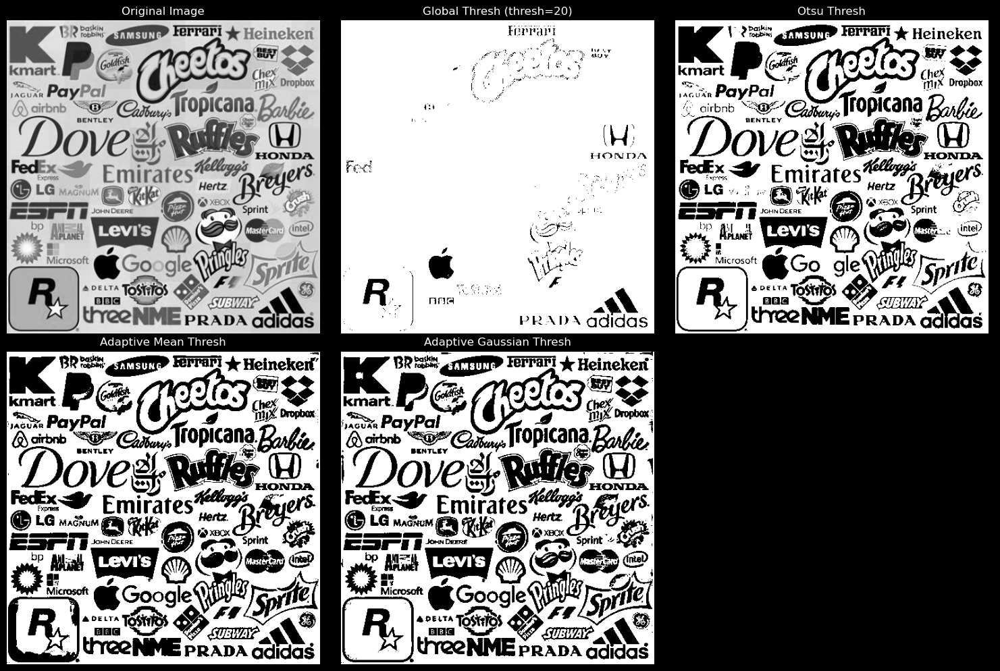

In [28]:
thresh      = 20
kernel_size = 51

# Thresholding methods
ret1, th1 = cv2.threshold(image_gray, thresh, 255, cv2.THRESH_BINARY)
ret2, th2 = cv2.threshold(image_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
th3 = cv2.adaptiveThreshold(image_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                            cv2.THRESH_BINARY, kernel_size, 2)
th4 = cv2.adaptiveThreshold(image_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                            cv2.THRESH_BINARY, kernel_size, 2)

# Titles and image list
titles = [
    'Original Image',
    f'Global Thresh (thresh={thresh})',
    'Otsu Thresh',
    'Adaptive Mean Thresh',
    'Adaptive Gaussian Thresh'
]
images = [image_gray, th1, th2, th3, th4]

# Create 2x3 subplot grid
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for i in range(5):
    axes[i].imshow(images[i], cmap='gray')
    axes[i].set_title(titles[i])
    axes[i].axis('off')

# Hide the last (unused) subplot
axes[5].axis('off')

plt.tight_layout()
plt.show()


# Get RGB and HSV histograms

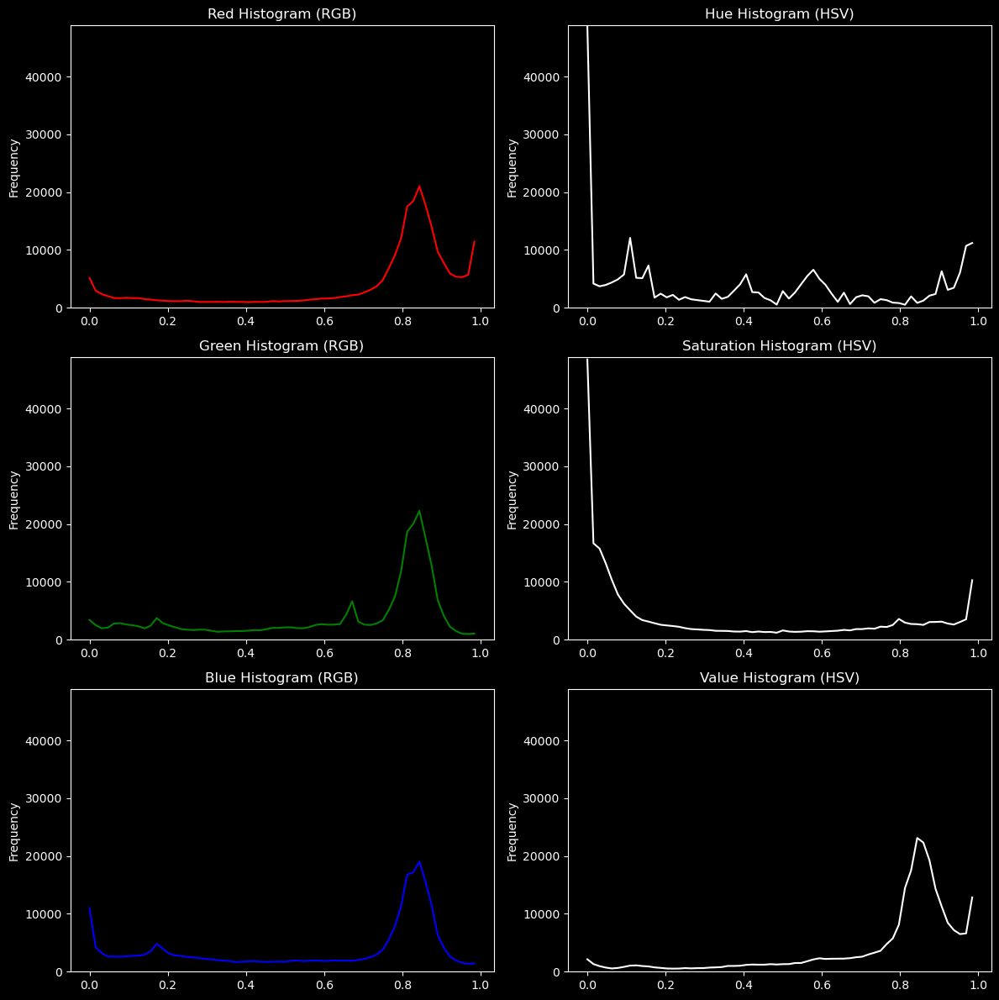

In [20]:
image_float = image.astype(np.float32) / 255.0

bins = 256 // 4

# ---------------------------
# Compute Histograms for RGB
# ---------------------------
r_hist, r_bins = np.histogram(image_float[:, :, 0], bins=bins, range=(0, 1))
g_hist, g_bins = np.histogram(image_float[:, :, 1], bins=bins, range=(0, 1))
b_hist, b_bins = np.histogram(image_float[:, :, 2], bins=bins, range=(0, 1))

# ---------------------------
# Convert Image to HSV and Compute Histograms
# ---------------------------
image_float_hsv = color.rgb2hsv(image_float)

h_hist, h_bins = np.histogram(image_float_hsv[:, :, 0], bins=bins, range=(0, 1))
s_hist, s_bins = np.histogram(image_float_hsv[:, :, 1], bins=bins, range=(0, 1))
v_hist, v_bins = np.histogram(image_float_hsv[:, :, 2], bins=bins, range=(0, 1))

# Compute the maximum frequency across all histograms for a uniform y-limit
max_val = max(np.max(r_hist), np.max(g_hist), np.max(b_hist),
              np.max(h_hist), np.max(s_hist), np.max(v_hist))

# ---------------------------
# Plotting: 3 rows x 2 columns (each channel on a separate subplot)
# ---------------------------
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))

# Row 1: Red (RGB) and Hue (HSV)
axes[0, 0].plot(r_bins[:-1], r_hist, color='r')
axes[0, 0].set_title('Red Histogram (RGB)')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_ylim(0, max_val)

axes[0, 1].plot(h_bins[:-1], h_hist, color='w')
axes[0, 1].set_title('Hue Histogram (HSV)')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_ylim(0, max_val)

# Row 2: Green (RGB) and Saturation (HSV)
axes[1, 0].plot(g_bins[:-1], g_hist, color='g')
axes[1, 0].set_title('Green Histogram (RGB)')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].set_ylim(0, max_val)

axes[1, 1].plot(s_bins[:-1], s_hist, color='w')
axes[1, 1].set_title('Saturation Histogram (HSV)')
axes[1, 1].set_ylabel('Frequency')
axes[1, 1].set_ylim(0, max_val)

# Row 3: Blue (RGB) and Value (HSV)
axes[2, 0].plot(b_bins[:-1], b_hist, color='b')
axes[2, 0].set_title('Blue Histogram (RGB)')
axes[2, 0].set_ylabel('Frequency')
axes[2, 0].set_ylim(0, max_val)

axes[2, 1].plot(v_bins[:-1], v_hist, color='w')
axes[2, 1].set_title('Value Histogram (HSV)')
axes[2, 1].set_ylabel('Frequency')
axes[2, 1].set_ylim(0, max_val)

plt.tight_layout()
plt.show()

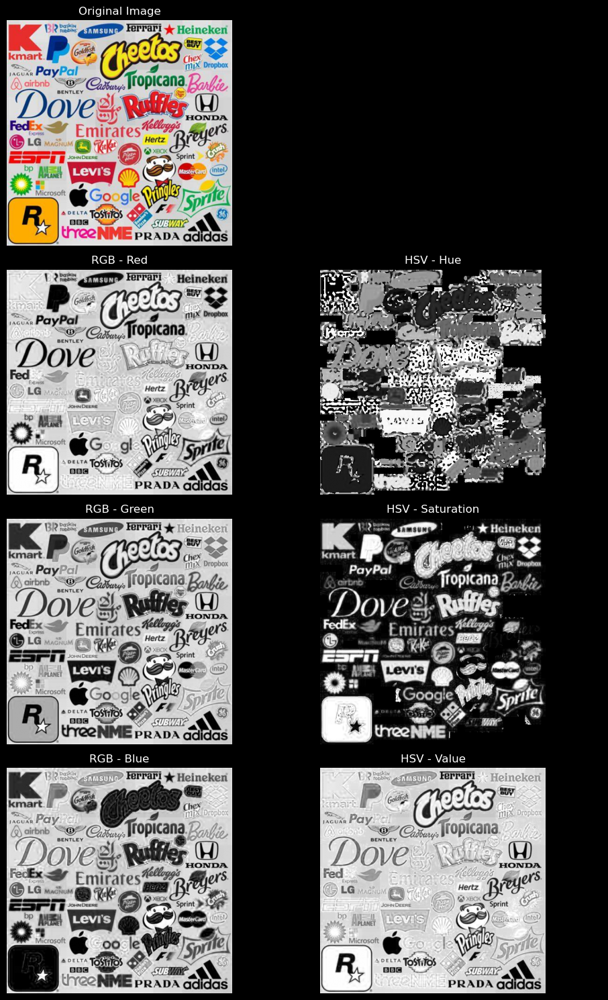

In [22]:
fig, axes = plt.subplots(4, 2, figsize=(10, 15))
axes = axes.ravel()

# Row 1: original image (span both columns)
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")  # empty to span layout

# Rows 2–4: RGB (left) and HSV (right)
channels_rgb = ['Red', 'Green', 'Blue']
channels_hsv = ['Hue', 'Saturation', 'Value']

for i in range(3):
    # RGB channels
    axes[2 * (i + 1)].imshow(image[:, :, i], cmap='gray')
    axes[2 * (i + 1)].set_title(f"RGB - {channels_rgb[i]}")
    axes[2 * (i + 1)].axis("off")
    
    # HSV channels
    axes[2 * (i + 1) + 1].imshow(image_float_hsv[:, :, i], cmap='gray')
    axes[2 * (i + 1) + 1].set_title(f"HSV - {channels_hsv[i]}")
    axes[2 * (i + 1) + 1].axis("off")

plt.tight_layout()
plt.show()

# Segmenting w/ K-means

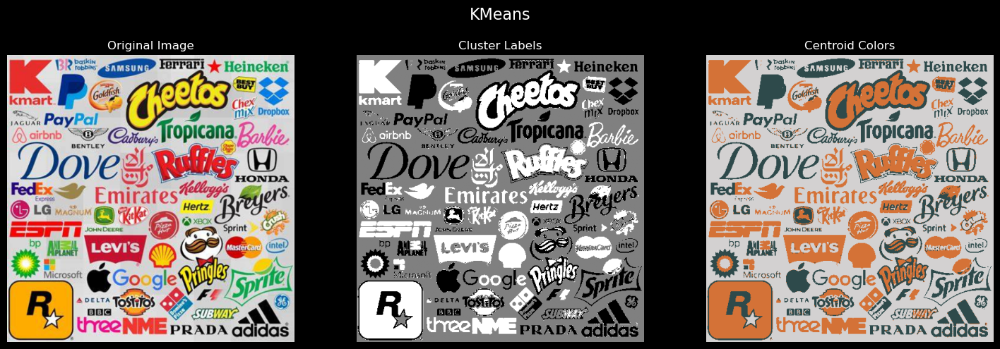

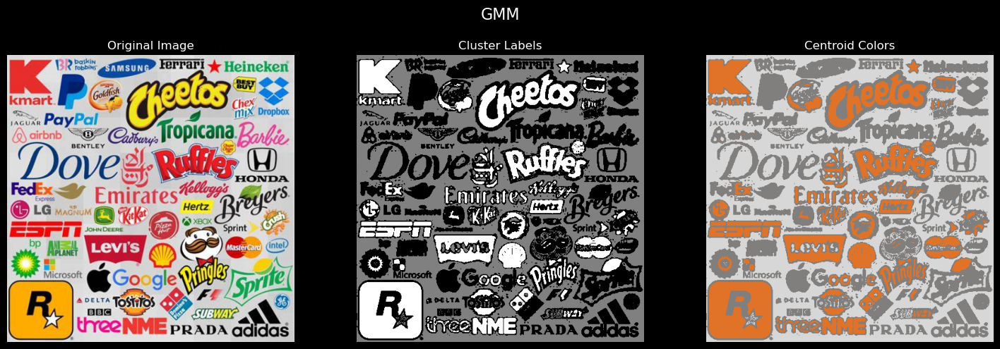

In [33]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

# Number of clusters
n_clusters = 3

# Prepare clustering methods
methods = []

# Get shape
h, w, c = image.shape

# Reshape to (num_pixels, 3)
pixels = image.reshape(-1, 3)
pixels.shape

# KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
k_labels = kmeans.fit_predict(pixels)
k_centers = kmeans.cluster_centers_
methods.append(('KMeans', k_labels, k_centers))

# GMM
gmm = GaussianMixture(n_components=n_clusters, random_state=42)
g_labels = gmm.fit_predict(pixels)
g_centers = gmm.means_
methods.append(('GMM', g_labels, g_centers))

# Plot each clustering method in its own figure
for name, labels, centers in methods:
    segmented = centers[labels].astype(np.uint8).reshape((h, w, 3))
    labels_img = labels.reshape((h, w))
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(name, fontsize=16)

    axes[0].imshow(image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(labels_img, cmap='gray')
    axes[1].set_title('Cluster Labels')
    axes[1].axis('off')

    axes[2].imshow(segmented)
    axes[2].set_title('Centroid Colors')
    axes[2].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Apply Gaussian blurs

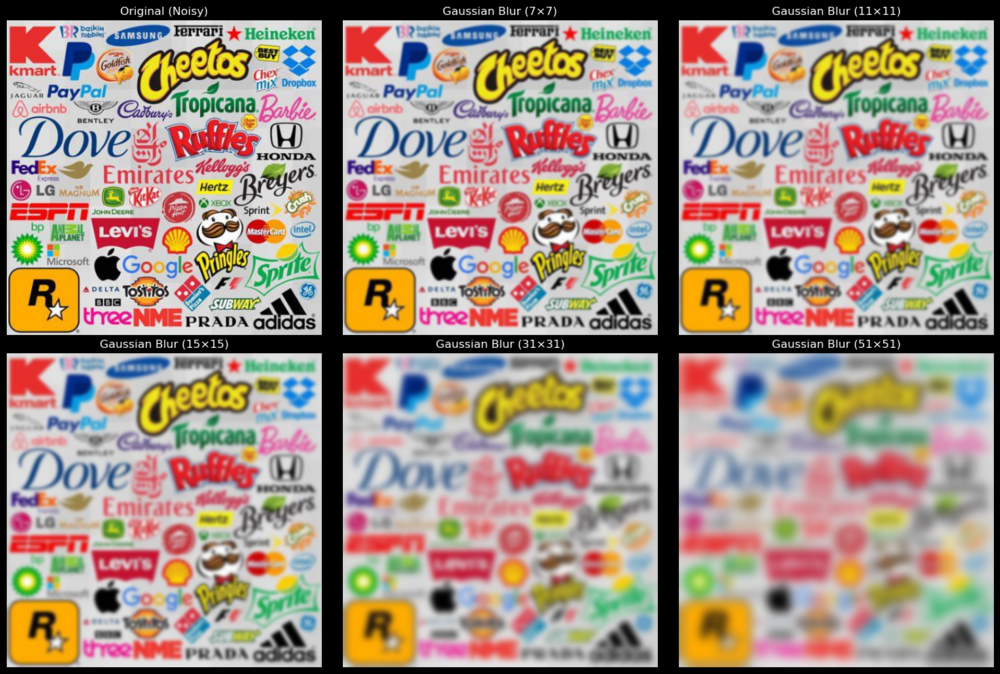

In [26]:
noise = np.random.normal(loc=0, scale=0, size=image.shape)
noisy_image = image.astype(float) + noise.astype(np.int16)
noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)

# Define kernel sizes for Gaussian blurring (must be odd)
kernel_sizes = [7, 11, 15, 31, 51]

# Set up figure (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

# Original image
axes[0].imshow(noisy_image)
axes[0].set_title("Original (Noisy)")
axes[0].axis("off")

# Apply Gaussian blur for each kernel size and plot
for i, k in enumerate(kernel_sizes, start=1):
    blurred = cv2.GaussianBlur(noisy_image, (k, k), 0)
    axes[i].imshow(blurred)
    axes[i].set_title(f"Gaussian Blur ({k}×{k})")
    axes[i].axis("off")

# Hide any unused subplot (if fewer than 6 images)
for j in range(len(kernel_sizes) + 1, 6):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

# Apply median blur

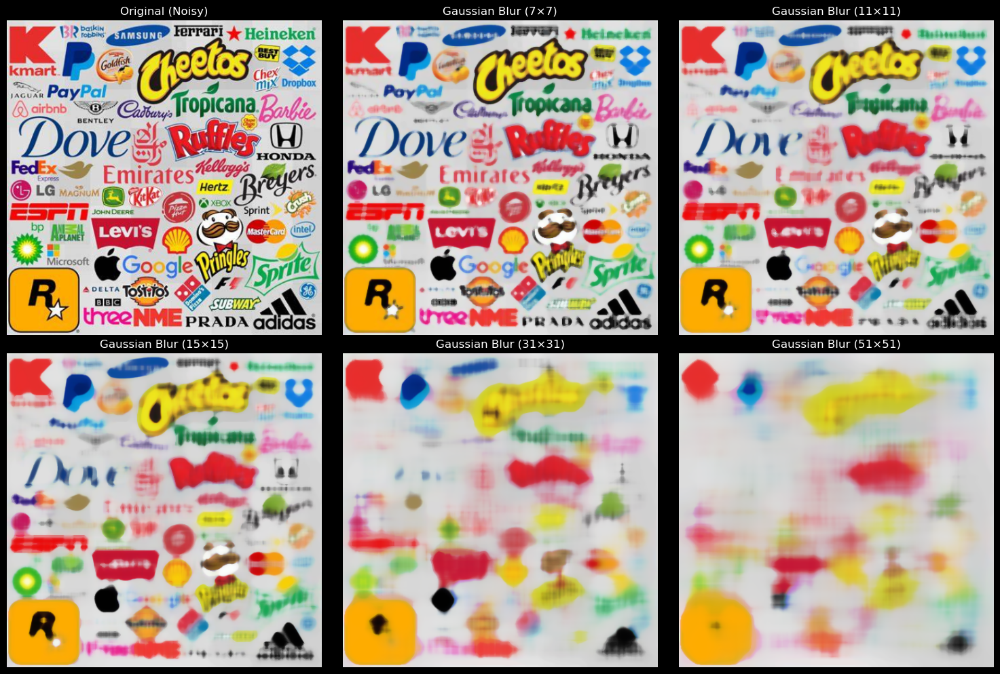

In [27]:
noise = np.random.normal(loc=0, scale=0, size=image.shape)
noisy_image = image.astype(float) + noise.astype(np.int16)
noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)

# Define kernel sizes for Gaussian blurring (must be odd)
kernel_sizes = [7, 11, 15, 31, 51]

# Set up figure (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

# Original image
axes[0].imshow(noisy_image)
axes[0].set_title("Original (Noisy)")
axes[0].axis("off")

# Apply Gaussian blur for each kernel size and plot
for i, k in enumerate(kernel_sizes, start=1):
    blurred = cv2.medianBlur(noisy_image, k)
    axes[i].imshow(blurred)
    axes[i].set_title(f"Gaussian Blur ({k}×{k})")
    axes[i].axis("off")

# Hide any unused subplot (if fewer than 6 images)
for j in range(len(kernel_sizes) + 1, 6):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

# Edge detection w/ Sobel filter

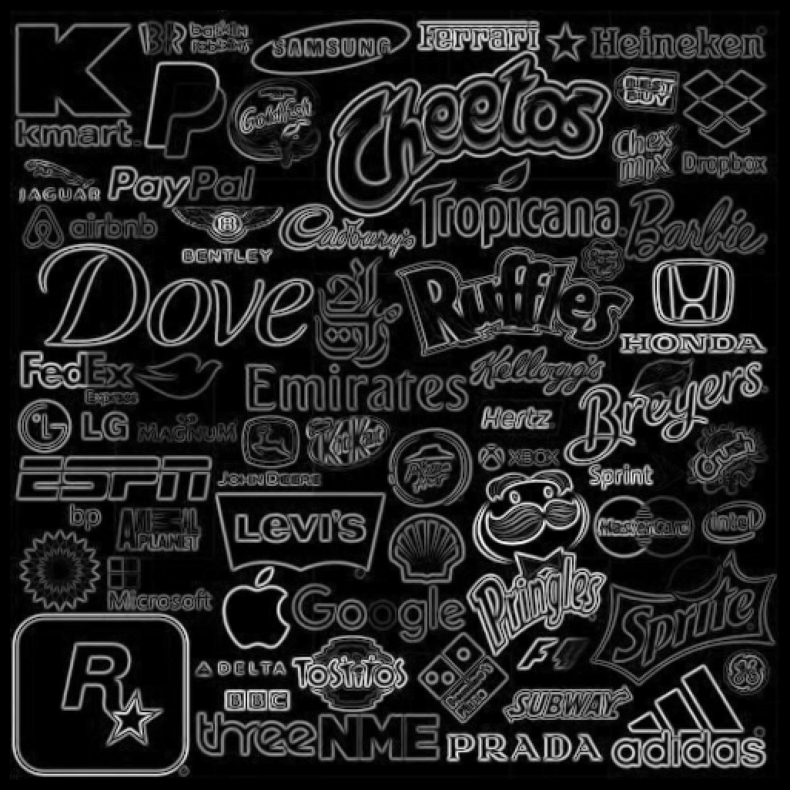

In [23]:
edges = filters.sobel(image_gray)

plt.figure(figsize=(10,10))
plt.imshow(edges, cmap='gray')
plt.axis('off')
plt.show()

# Apply a custom kernel to a grayscale image

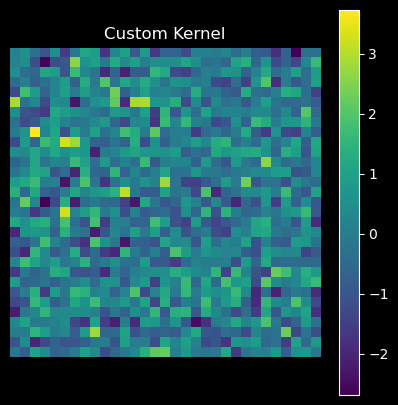

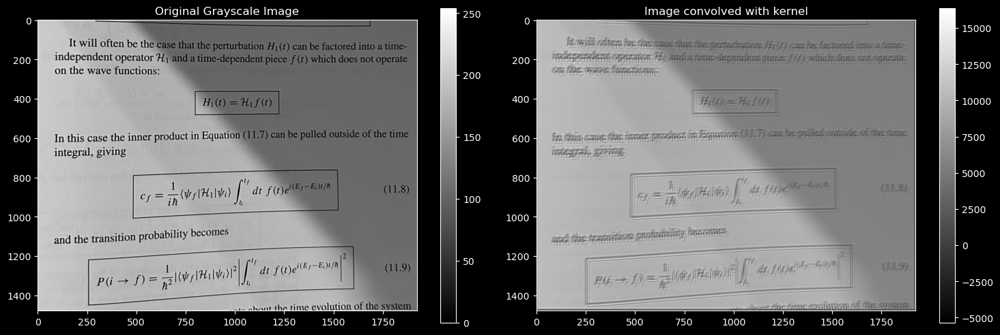

In [13]:
from scipy.signal import convolve2d

# Define the kernel size k (for example, 5x5)
k = 31

# Create a custom kernel of size k x k.
# For example, here we create a uniform averaging kernel:
kernel = np.ones((k, k))
kernel = kernel / kernel.sum()

#kernel = np.diag( [1]*k )
#kernel = kernel / kernel.sum()
#kernel = kernel[::-1,:]

#kernel = np.random.rand(k,k)
#kernel = kernel / kernel.sum()

kernel = np.random.randn(k,k)

#freq = 2
#kernel = -np.repeat( np.sin( 2 * np.pi * freq * np.arange(k) / k ), k ).reshape(k,k).T

plt.figure(figsize=(5, 5))
im = plt.imshow(kernel, interpolation='none', cmap='viridis')
plt.title("Custom Kernel")
plt.colorbar(im)
plt.axis('off')
plt.show()

# Apply the kernel to image_gray using zero padding.
# Using scipy.signal.convolve2d: mode='same' returns an output the same size as input,
# and boundary='fill' with fillvalue=0 applies zero padding.
convolved_image = convolve2d(image_gray, kernel, mode='same', boundary='fill', fillvalue=0)

# Plot the original and convolved images
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
im2 = plt.imshow(image_gray, cmap='gray')
plt.colorbar(im2)
plt.title('Original Grayscale Image')

plt.subplot(1, 2, 2)
im3 = plt.imshow(convolved_image, cmap='gray')
plt.colorbar(im3)
plt.title('Image convolved with kernel')

plt.tight_layout()
plt.show()